In [1]:
from tensorflow import keras
import tensorflow_datasets as tfds
import tensorflow as tf
from keras.layers import (Input, Dense, Conv2D, Conv2DTranspose, BatchNormalization, UpSampling2D, LeakyReLU,
                          Dropout, Flatten, Reshape, Lambda, MaxPool2D, RandomContrast, Concatenate, add, Cropping2D)
from keras.models import Model
from keras.optimizers import RMSprop, Adam
from math import log2
import matplotlib.pyplot as plt
from random import randint
import numpy as np

In [2]:
# Константы
img_side = 256

# Разбиваем датасет на тренировочную группу и группу валидации
def init_data_with_batch_size(batch_size):
    global train_data, val_data
    train_data = tf.keras.utils.image_dataset_from_directory(
        # Чтобы использовать "new_flowers" (расширенный датасет) надо запустить increasing_data.py
        "flowers",
        image_size=(img_side, img_side),
        shuffle=True,
        batch_size=batch_size,

        subset="training",
        validation_split=0.1,
        seed=42,
    )
    val_data = tf.keras.utils.image_dataset_from_directory(
        # Чтобы использовать "new_flowers" (расширенный датасет) надо запустить increasing_data.py
        "flowers",
        image_size=(img_side, img_side),
        shuffle=True,
        batch_size=batch_size,

        subset="validation",
        validation_split=0.1,
        seed=42,
    )

    # Убираем лейблы (т.к. у нас задача не распознавать изображения)
    train_data = train_data.map(lambda x, y: (x/255., x/255.))
    val_data = val_data.map(lambda x, y: (x/255., x/255.))

    return train_data, val_data

Модель

In [12]:
# Константы
dropout = 0.1
dense_factor = 16    # Какую часть картинки обрабатываем Dense (4**2 == четверть картинки)

filters = 4          # Нижняя граница
hidden_units = 4**5  # Только степень 4 (4**?) (Размер "смыслового вектора")

amount_encode_layers = 4
amount_decode_layers = 4
max_boudle_residual_layers = 1  # Сколько слоёв с остаточноым обучением ПЕРЕД уменьшением/увеличением картинки

input_img = Input(shape=(img_side, img_side, 3))

"""Энкодер"""
# Это надо чтобы первый слой мог сложиться со следующим (при помощи add([x_temp, x]) )
x_temp = Conv2D(filters*2**amount_encode_layers, (3, 3), activation=LeakyReLU(0.1), padding="same")(input_img)

for i in range(amount_encode_layers, 0, -1):
    for _ in range(max_boudle_residual_layers):
        x = Conv2D(filters * 2**i, (3, 3), activation=LeakyReLU(0.1), padding="same")(x_temp)
        x = Conv2D(filters * 2**i, (3, 3), activation=LeakyReLU(0.1), padding="same")(x)
        x_temp = add([x_temp, x])

    x = MaxPool2D()(x_temp)
    x_temp = Conv2D(filters * 2**(i - 1), (3, 3), activation=LeakyReLU(0.1), padding="same")(x)


"""Декодер"""
x_temp = Conv2D(filters, (3, 3), activation=LeakyReLU(0.1), padding="same")(x_temp)

# Расширяем карту признаков, увеличиваем картинку и количество фильтров
for i in range(amount_decode_layers):
    for _ in range(max_boudle_residual_layers):
        x = Conv2D(filters * 2**i, (3, 3), activation=LeakyReLU(0.1), padding="same")(x_temp)
        x = Conv2D(filters * 2**i, (3, 3), activation=LeakyReLU(0.1), padding="same")(x)
        x_temp = add([x_temp, x])

    # Чтобы количество фильтров совпадало (для остаточного обучения)
    x_temp = Conv2DTranspose(filters * 2**(i + 1), (3, 3), activation=LeakyReLU(0.1), padding="same", strides=2)(x_temp)
x = x_temp

# Постепенно уменьшаем количество фильтров
for i in range(int(log2(x.shape[-1])), 1, -1):
    x = Conv2D(2**i, (3, 3), activation=LeakyReLU(0.1), padding="same")(x)

x = Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

# Увеличиваем чёткость при помощи Dense (берём кусочек картинки)
# (проходимся по каждому каналу отдельно)
x = Reshape((3 * dense_factor, img_side**2 // dense_factor))(x)
x = Dropout(dropout)(x)
x = Dense(img_side**2 // dense_factor, activation="sigmoid")(x)
x = Reshape((img_side, img_side, 3))(x)


# Модель
output_img = x
vae = Model(input_img, output_img, name="vae")
vae.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="binary_crossentropy",
    loss_weights=[1000],
)

vae.summary()

Model: "vae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_140 (Conv2D)            (None, 256, 256, 64  1792        ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_141 (Conv2D)            (None, 256, 256, 64  36928       ['conv2d_140[0][0]']             
                                )                                                               

In [13]:
train_data, val_data = init_data_with_batch_size(8)
vae.fit(
    train_data,
    epochs=100,
    validation_data=val_data,
)

Found 2799 files belonging to 5 classes.
Using 2520 files for training.
Found 2799 files belonging to 5 classes.
Using 279 files for validation.
Epoch 1/100
315/315 [==============================] - 145s 456ms/step - loss: 569.5444 - val_loss: 524.9523
Epoch 2/100
315/315 [==============================] - 142s 451ms/step - loss: 527.2531 - val_loss: 517.4642
Epoch 3/100
315/315 [==============================] - 143s 453ms/step - loss: 518.8230 - val_loss: 502.9283
Epoch 4/100
315/315 [==============================] - 144s 456ms/step - loss: 503.6854 - val_loss: 491.2938
Epoch 5/100
315/315 [==============================] - 142s 450ms/step - loss: 497.4726 - val_loss: 488.4357
Epoch 6/100
315/315 [==============================] - 142s 450ms/step - loss: 493.6574 - val_loss: 484.7689
Epoch 7/100
315/315 [==============================] - 142s 451ms/step - loss: 492.3816 - val_loss: 486.2064
Epoch 8/100
315/315 [==============================] - 142s 451ms/step - loss: 490.1866 - va

KeyboardInterrupt: 

Found 2799 files belonging to 5 classes.
Using 2520 files for training.
Found 2799 files belonging to 5 classes.
Using 279 files for validation.


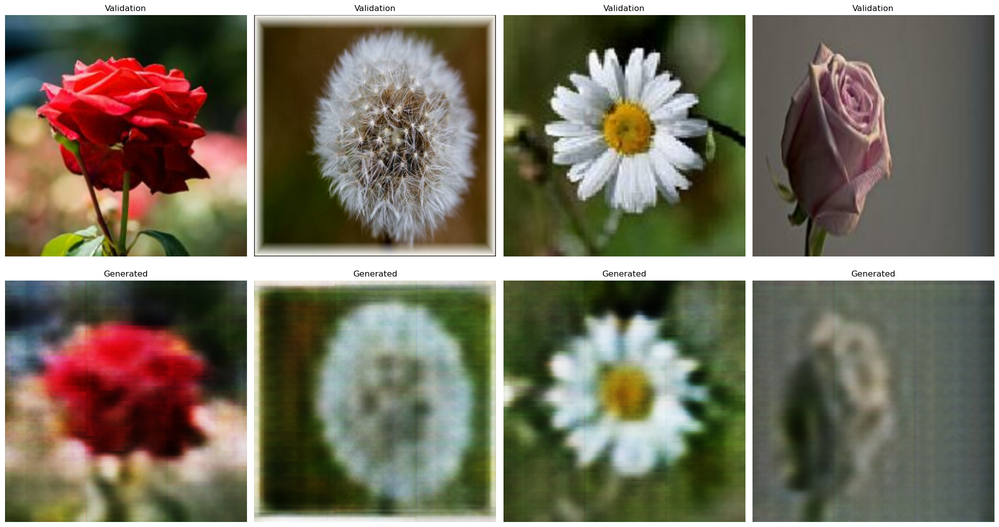

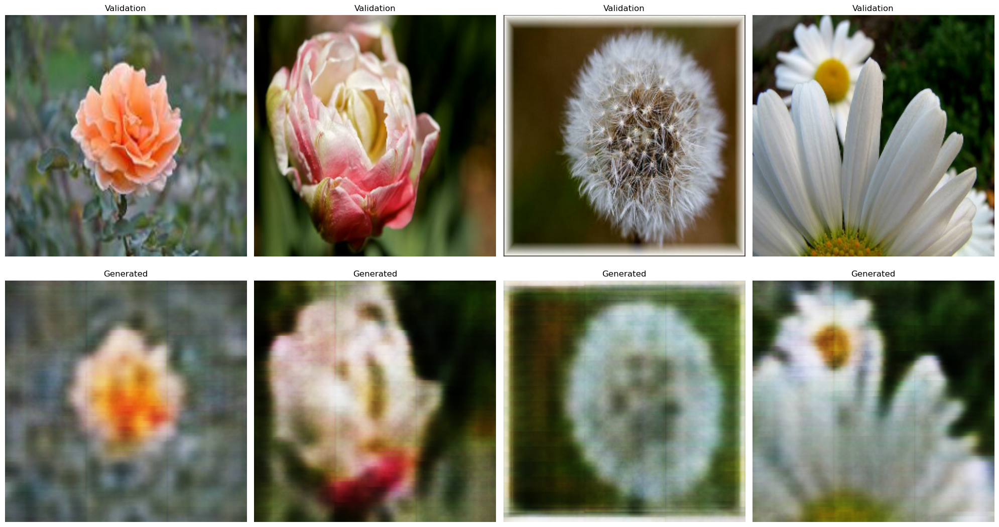

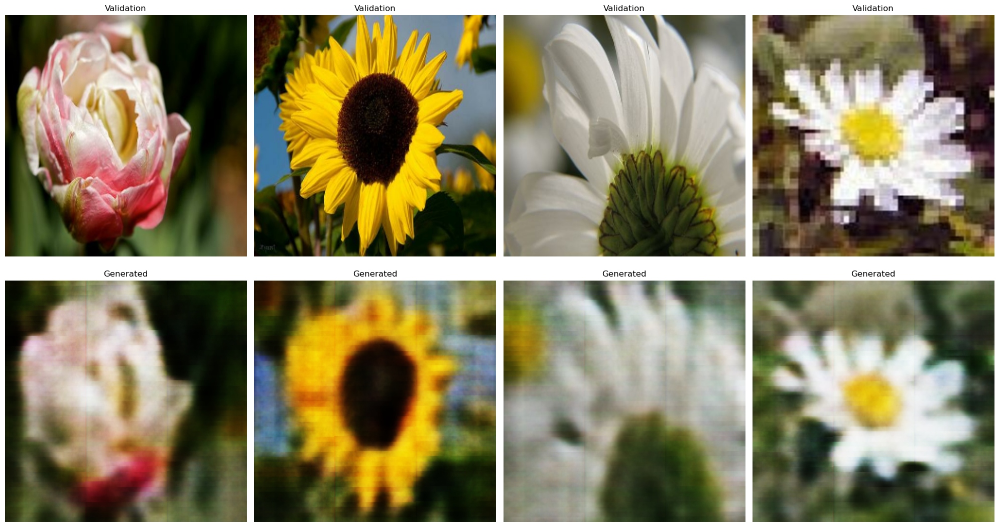

Found 2799 files belonging to 5 classes.
Using 2520 files for training.
Found 2799 files belonging to 5 classes.
Using 279 files for validation.


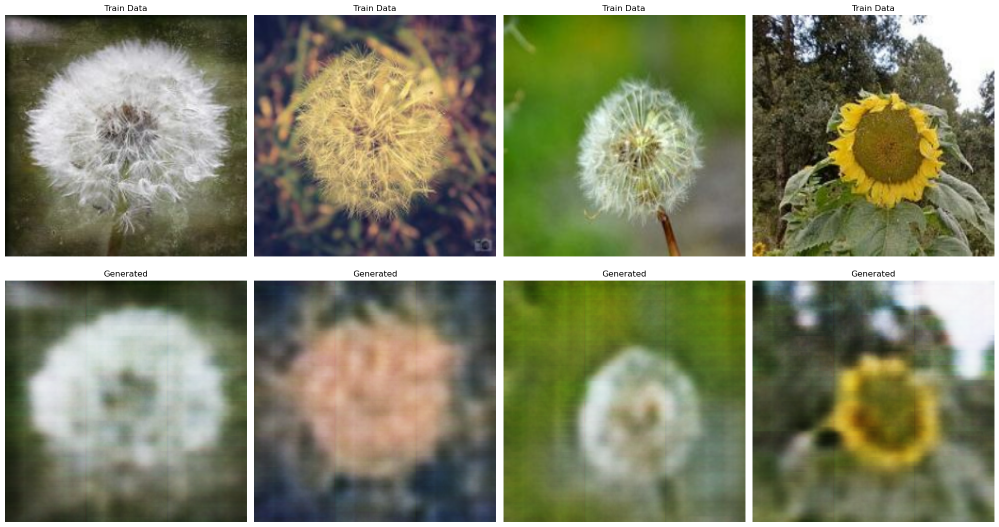

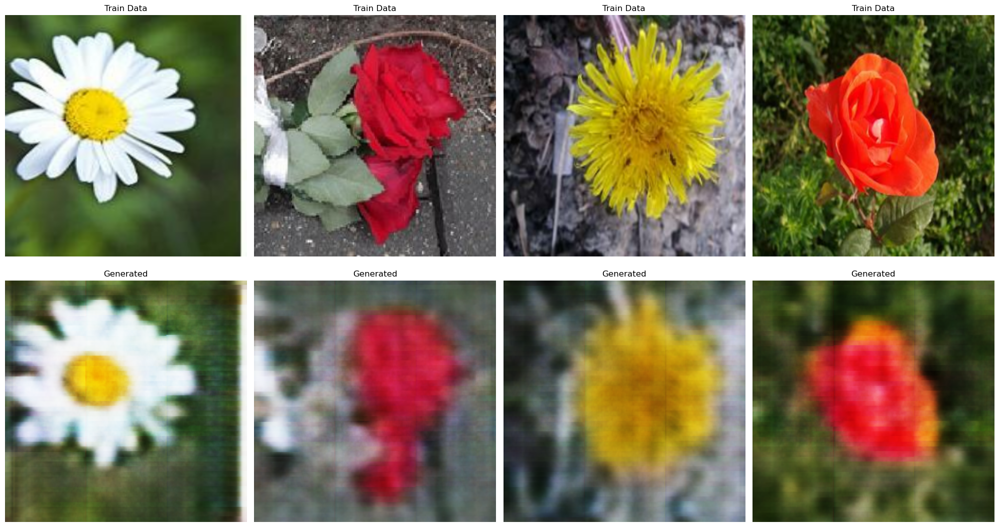

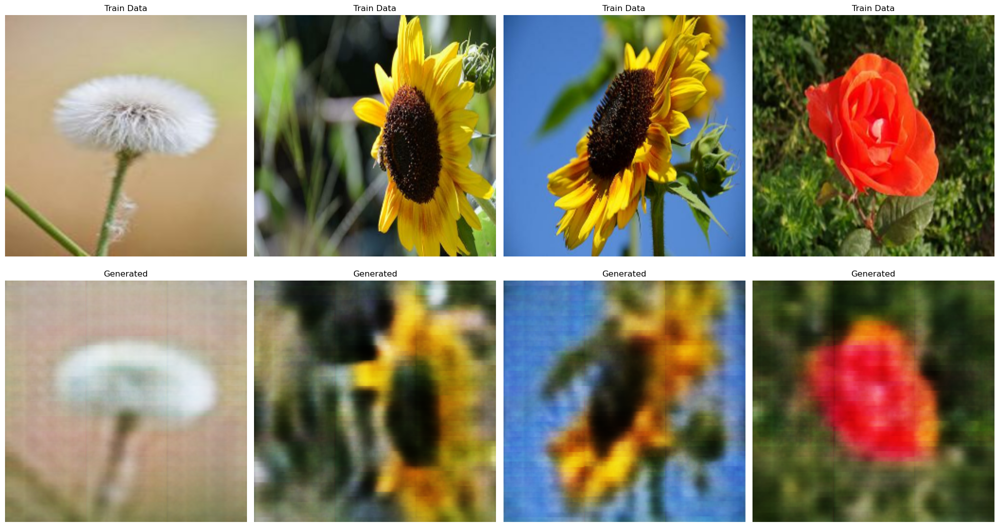

In [14]:
def show_row_images(raw_data, title):
    data = np.array([i[0][0] for count, i in enumerate(raw_data)
                         if count < 32])
    generated_images = vae.predict(data, verbose=False)

    num_images = 4

    plt.figure(figsize=(20, 11))

    for _ in range(num_images):
        random_num = randint(0, 32-1)

        # Оригинальное изображение
        plt.subplot(2, num_images, _ + 1)
        plt.imshow(data[random_num])
        plt.gray()
        plt.title(title)
        plt.axis("off")

        # Сгенерированное изображение
        plt.subplot(2, num_images, _ + num_images + 1)
        plt.imshow(generated_images[random_num])
        plt.gray()
        plt.title("Generated")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

_, val_data = init_data_with_batch_size(1)
for _ in range(3):
    show_row_images(val_data, "Validation")

train_data, _ = init_data_with_batch_size(1)
for _ in range(3):
    show_row_images(train_data, "Train Data")

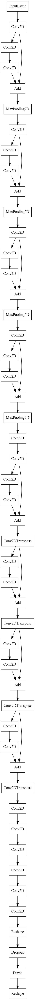

In [29]:
"""Выводим Архитектуру"""
img_file = "architecture.png"
tf.keras.utils.plot_model(vae, to_file=img_file, show_shapes=False, show_layer_names=False,
                          dpi=128, show_layer_activations=False)